## Loading the dependencies

In [48]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import random

from PIL import Image, ImageDraw
from collections import Counter
from sklearn.model_selection import train_test_split


In [49]:
import torchvision
import torch

from torchvision import transforms as tf
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

## Link the directories and extract the coordinates

In [50]:
train_dir = os.path.join("wally dset v2.v10i.tensorflow", "train")
train_CSV_dir = os.path.join("wally dset v2.v10i.tensorflow", "train", "_annotations.csv")
train = pd.read_csv(train_CSV_dir)

valid_dir = os.path.join("wally dset v2.v10i.tensorflow", "valid")
valid_CSV_dir = os.path.join("wally dset v2.v10i.tensorflow", "valid", "_annotations.csv")
valid = pd.read_csv(valid_CSV_dir)


In [51]:
train_coordinates = pd.DataFrame(list(zip(train.xmin.values, train.ymin.values, train.xmax.values, train.ymax.values)), columns=["x1", "y1", "x2", "y2"])
train_coordinates.head()

valid_coordinates = pd.DataFrame(list(zip(valid.xmin.values, valid.ymin.values, valid.xmax.values, valid.ymax.values)), columns=["x1", "y1", "x2", "y2"])
valid_coordinates.head()

,x1,y1,x2,y2
0,25,11,42,34
1,18,4,48,42
2,14,11,46,46
3,715,157,733,181
4,428,83,483,145


## Formulate the correct data and prepare for input

In [52]:
df_train = pd.concat([train, train_coordinates], axis=1)
df_train.drop(["width", "height", "class", "xmin", "ymin", "xmax", "ymax"], axis=1, inplace=True)

df_valid = pd.concat([valid, valid_coordinates], axis=1)
df_valid.drop(["width", "height", "class", "xmin", "ymin", "xmax", "ymax"], axis=1, inplace=True)

In [53]:
train_imgList = df_train.filename.unique()
valid_imgList = df_valid.filename.unique()


## Defining the class that'll be used when training the module

In [54]:
class waldoData(torch.utils.data.Dataset):
    def __init__(self, dataframe, imgsList, img_dir, indices):
        self.df = dataframe
        self.imgsList = imgsList
        self.indices = indices
        self.img_dir = img_dir

    def __len__(self):
        return len(self.indices)
    
    def __getitem__(self, index):
        getIMG_name = self.imgsList[self.indices[index]]
        box = self.df[self.df.filename == getIMG_name].values[:, 1:].astype("int")
        
        img_type = ".jpg"
        #getIMG_dir = os.path.join("wally dset v2.v10i.tensorflow", "train", getIMG_name)
        getIMG_dir = os.path.join(self.img_dir, getIMG_name)
        img = Image.open(getIMG_dir).convert("RGB")
        labels = torch.ones((box.shape[0]), dtype=torch.int64)
        target = {}
        target["boxes"] = torch.tensor(box)
        target["label"] = labels

        output = tf.ToTensor()(img), target

        return output

In [55]:
#training_set = list(train_imgList)
#testing_set = list(valid_imgList)

training_set, dummy_set = train_test_split(range(train_imgList.shape[0]), test_size=None)
testing_set, dummy_set = train_test_split(range(valid_imgList.shape[0]), test_size=None)

def custom_collate(batch):
    return batch

len(training_set), len(testing_set)

(80, 12)

## Create the custom dataloaders which will be passed for training and testing

In [57]:
def createDataloader(className, dataframe, imgsList, direct, d_set, batch_size):
    outputLoader = torch.utils.data.DataLoader(className(dataframe, imgsList, direct, d_set), 
                                               batch_size=batch_size, collate_fn=custom_collate, 
                                               pin_memory=True if torch.cuda.is_available() else False)
    return outputLoader

training_dataloader = createDataloader(waldoData, df_train, train_imgList, train_dir, training_set, 16)
validation_dataloader = createDataloader(waldoData, df_valid, valid_imgList, valid_dir, testing_set, 8)

## Create the model and train

In [58]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)


/opt/homebrew/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [59]:
num_classes = 2
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

device = torch.device("cpu")

optimizer = torch.optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0005)
epochs_amount = 10

In [60]:
model.to(device)

for e in range(epochs_amount):
    e_loss = 0
    for data in training_dataloader:
        imgs = []
        targets = []
        for item in data:
            imgs.append(item[0].to(device))
            loopTarg = {}
            loopTarg["boxes"] = item[1]["boxes"].to(device)
            loopTarg["labels"] = item[1]["label"].to(device)
            targets.append(loopTarg)
        
        loss_dictionary = model(imgs, targets)
        loss_value = sum(x for x in loss_dictionary.values())
        e_loss += loss_value.cpu().detach().numpy()
        optimizer.zero_grad()
        loss_value.backward()
        optimizer.step()
    print(f"{e} -- Epoch Loss: {e_loss}")

0 -- Epoch Loss: 2.417807787656784
1 -- Epoch Loss: 1.2690180838108063
2 -- Epoch Loss: 0.9292578548192978
3 -- Epoch Loss: 0.9460615366697311
4 -- Epoch Loss: 0.8853567838668823
5 -- Epoch Loss: 0.8237796574831009
6 -- Epoch Loss: 0.8052846789360046
7 -- Epoch Loss: 0.8133204877376556
8 -- Epoch Loss: 0.8189045637845993
9 -- Epoch Loss: 0.7845182567834854


## Test the model with some images and print the image and accuracy percentage

In [385]:
model.eval()
data = next(iter(validation_dataloader))
(len(data))


8

Image 0
Result Tuple: ([9.702521324157715, 10.124160766601562, 48.02159118652344, 45.1647834777832], 79.83294565232254)
Model Accuracy to actual coordinates: 79.83%


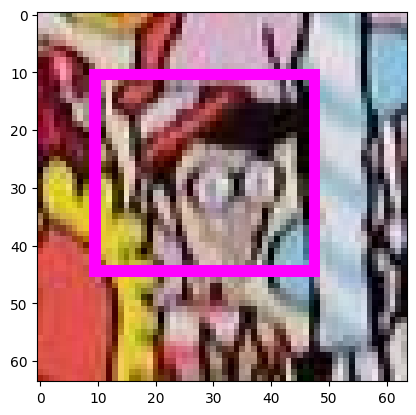

Image 1
Result Tuple: ([27.123746871948242, 16.36542510986328, 45.51984786987305, 41.99241256713867], 68.32415210675221)
Model Accuracy to actual coordinates: 68.32%


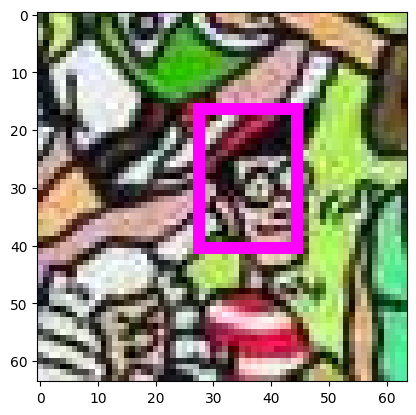

Image 2
Result Tuple: ([26.095916748046875, 4.623294353485107, 44.4306640625, 29.429853439331055], 53.031214582681166)
Model Accuracy to actual coordinates: 53.03%


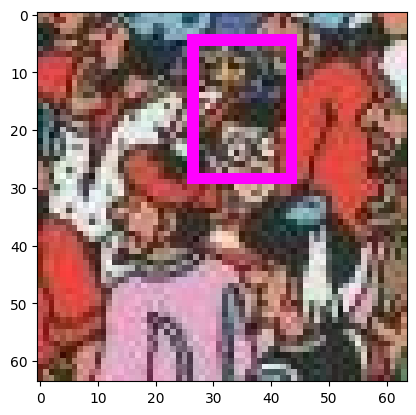

Image 3
Result Tuple: ([302.9381408691406, 891.41650390625, 346.51641845703125, 943.02294921875], 0.0)
Model Accuracy to actual coordinates: 0.00%
Model Failed Accuracy Test


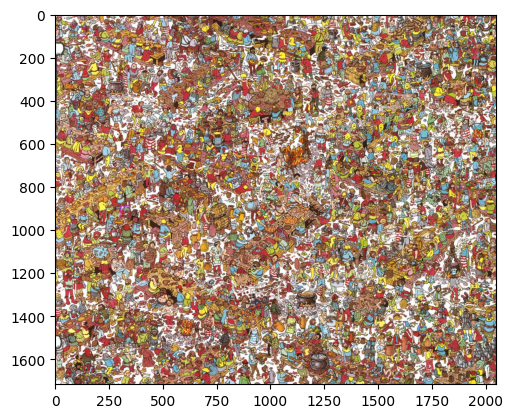

Image 4
No Predictions
Image 5
Result Tuple: ([38.189754486083984, 18.58466911315918, 60.37324905395508, 45.978065490722656], 62.518648121113074)
Model Accuracy to actual coordinates: 62.52%


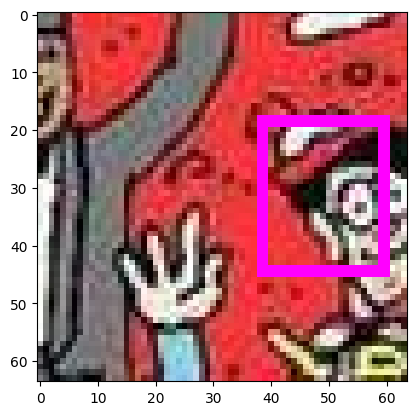

Image 6
Result Tuple: ([50.901329040527344, 198.93431091308594, 70.44361114501953, 220.00119018554688], 0.0)
Model Accuracy to actual coordinates: 0.00%
Model Failed Accuracy Test


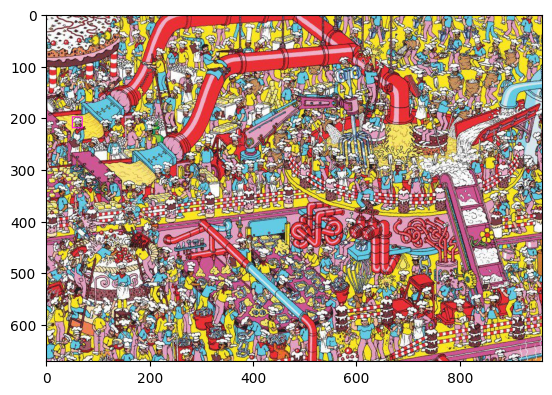

Image 7
Result Tuple: ([855.8204345703125, 186.64120483398438, 892.89794921875, 224.8243865966797], 0.0)
Model Accuracy to actual coordinates: 0.00%
Model Failed Accuracy Test


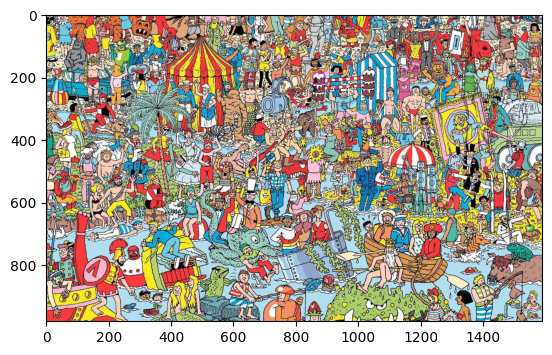

In [467]:
# Calculates overlap percentage between two bounding boxes
def calcOverlap(x1, y1, x2, y2, a1, b1, a2, b2):
    area1 = (x2 - x1) * (y2 - y1)
    area2 = (a2 - a1) * (b2 - b1)

    x_over = max(0, min(x2, a2) - max(x1, a1))
    y_over = max(0, min(y2, b2) - max(y1, b1))

    intersection = x_over * y_over
    overlap = intersection / (area1 + area2 - intersection)
    return (overlap * 100)

imgContainer = []

for i in range(len(data)):
    print(f"Image {i}")
    # Image, Boxes, Labels are obtained from the data
    iter_img = data[i][0]
    iter_box = data[i][1]["boxes"]
    iter_label = data[i][1]["label"]
    output = model([iter_img.to(device)])
    outputBB = output[0]["boxes"]
    outputScore = output[0]["scores"]
    keep = torchvision.ops.nms(outputBB, outputScore, 0.5)
    imgPermutation = (iter_img * 255).permute(1, 2, 0).cpu().detach().numpy().astype("uint8")
    vSample = Image.fromarray(imgPermutation)
    
    draw = ImageDraw.Draw(vSample)

    actual = iter_box[0].detach().tolist()
    # Stores the predicted bounding box and the overlap percentage
    tupleStorage = []
    for b in outputBB:
        predicted = b.detach().tolist()
        overlapPercentage = calcOverlap(predicted[0], predicted[1], predicted[2], predicted[3], actual[0], actual[1], actual[2], actual[3])
        tupleStorage.append((predicted, overlapPercentage))

    if len(tupleStorage) == 0:
        print("No Predictions")
        continue
    result_tuple = max(tupleStorage, key=lambda x: x[1])
    print(f"Result Tuple: {result_tuple}")
    # Print Result
    print(f"Model Accuracy to actual coordinates: {result_tuple[1]:.2f}%")
    if result_tuple[1] < 50:
        print("Model Failed Accuracy Test")

    draw.rectangle(list(result_tuple[0]), fill=None, outline="magenta", width=2)

    imgContainer.append(vSample)
    plt.imshow(vSample)
    plt.show()



## Same testing, but individually

In [461]:
randValue = random.randint(0, len(data)-1)
print(f"Random Value: {randValue}")
imgExtr = data[randValue][0]
boxExtr = data[randValue][1]["boxes"]
labelsExtr = data[randValue][1]["label"]


Random Value: 3


In [462]:
output = model([imgExtr.to(device)])

outputBoundaryBox = output[0]["boxes"]
outputScores = output[0]["scores"]


In [463]:
keep = torchvision.ops.nms(outputBoundaryBox, outputScores, 0.5)
outputBoundaryBox.shape
#keep.shape

torch.Size([43, 4])

In [464]:
imgPermutation = (imgExtr * 255).permute(1, 2, 0).cpu().detach().numpy().astype("uint8")
vSample = Image.fromarray(imgPermutation)

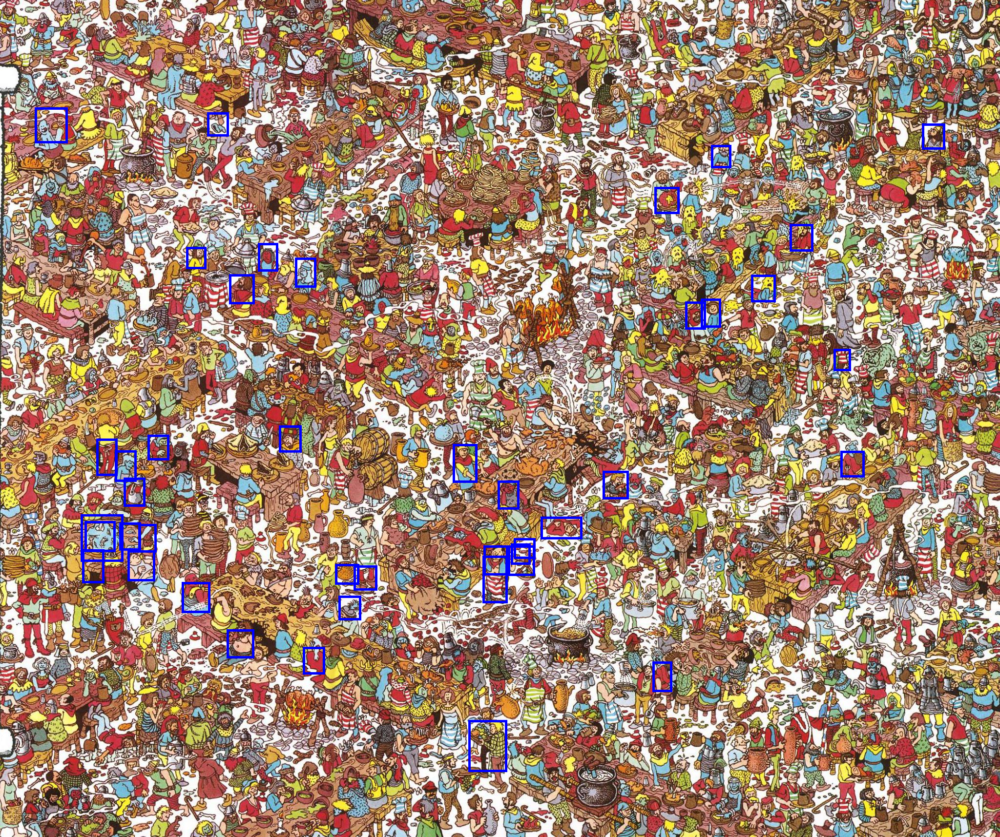

In [466]:
draw = ImageDraw.Draw(vSample)
#for b in boxExtr:

def calcOverlap(x1, y1, x2, y2, a1, b1, a2, b2):
    area1 = (x2 - x1) * (y2 - y1)
    area2 = (a2 - a1) * (b2 - b1)

    x_over = max(0, min(x2, a2) - max(x1, a1))
    y_over = max(0, min(y2, b2) - max(y1, b1))

    intersection = x_over * y_over
    overlap = intersection / (area1 + area2 - intersection)
    return (overlap * 100)


actual = boxExtr[0].detach().tolist()
tupleStorage = []
for b in outputBoundaryBox:
    predicted = b.detach().tolist()
    overlapPercentage = calcOverlap(predicted[0], predicted[1], predicted[2], predicted[3], actual[0], actual[1], actual[2], actual[3])
    tupleStorage.append((predicted, overlapPercentage))

result_tuple = tupleStorage

for b in tupleStorage:
    #print(b[0])
    draw.rectangle((list(b[0])), fill=None, outline="blue", width=5)

vSample